Copyright 2021, Theorem Engine

This program is free software: you can redistribute it and/or modify it under the terms of the GNU General Public License as published by the Free Software Foundation, either version 3 of the License, or (at your option) any later version.

This program is distributed in the hope that it will be useful, but WITHOUT ANY WARRANTY; without even the implied warranty of MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.  See the GNU General Public License for more details.

You should have received a copy of the GNU General Public License along with this program.  If not, see <https://www.gnu.org/licenses/>.

# <center> Avelino et al Model </center>

This notebook walks the user through a simple experiment using the Avelino et al model from:

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Avelino, Bazeia, Menezes, and de Oliveira. "String Networks in Z_N Lotka-Volterra Competition Models." *Physics Letters A* Vol. 378 No. 4, pp. 393-397. https://arxiv.org/abs/1305.4253v2

This is similar to the May-Leonard model, but with symmetric competition. The
model allows empty sites and up to N species, which interact with the following
reactions:

1. **Birth:** Species may give birth into empty sites, $i0\to ii$, at rate 0.1.
2. **Mobility:** Two sites may swap contents, $ij\to ji$, at rate 0.15.
3. **Predation:** Each species $i$ preys on species $(i + 2), (i + 2), ..., (i + N - 2)$, where addition is modulo $N$ - so in a 5-species model, species 3 preys on species 1 and 5. The predation reaction has form $ij\to i0$, at rate 0.75.

In [1]:
%matplotlib inline

from itertools import product

from IPython.display import HTML
import matplotlib
import matplotlib.pyplot as plot
import numpy as np
import viridicle

# Allow larger videos than default limit
matplotlib.rcParams['animation.embed_limit'] = 30_000_000

# Number of species
N = 4
# Lattice width
WIDTH = 256

We begin by constructing the viridicle model. ``beta`` will be the rules tensor encoding our possible transitions. Since we do not specify an initial system state, it's initialized randomly for us.

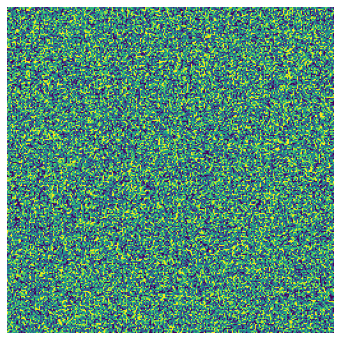

In [2]:
# Encode rules. First predation:
rules = [
    f'{i},{((i + j - 1) % N) + 1}->{i},0@0.75'
    for i in range(1, N + 1) for j in range(2, N - 1)
]
# Birth rate:
rules += [f'{i},0->{i},{i}@0.1' for i in range(1, N + 1)]
# Mobility:
rules += [
    f'{i},{j}->{j},{i}@0.15'
    for i, j in product(*([range(N + 1)] * 2))
    if (i != j)
]
# Initialize model
geo = viridicle.LatticeGeography((WIDTH, WIDTH), rules, num_states=(N + 1))

# Display system initial state
plot.figure(figsize=(6, 6))
plot.imshow(geo.sites)
plot.axis('off')
plot.show()

We'll now run the model forward for 400 time, capturing the system state every 2.0 time.

In [3]:
counts, record = geo.run(400.0, return_sites=True, report_every=2.0)

Let's plot species abundances over time.

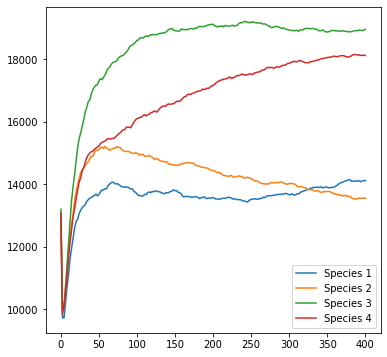

In [4]:
plot.figure(figsize=(6, 6))
for s in range(1, N + 1):
    plot.plot(
        np.arange(0.0, 401.0, 2.0),
        counts[:, s],
        label=f'Species {s}',
    )
plot.legend()
plot.show()

And here's the video:

In [5]:
# Syntax taken from:
# https://stackoverflow.com/questions/51702749/numpy-array-as-video-in-jupyter-notebook

fig = plot.figure(figsize=(6, 6))
im = plot.imshow(record[0, :, :])
plot.axis('off')
plot.close()

def init():
    im.set_data(record[0, :, :])

def animate(i):
    im.set_data(record[i, :, :])
    return im

anim = matplotlib.animation.FuncAnimation(
    fig, animate, init_func=init, frames=record.shape[0],
    interval=50
)
HTML(anim.to_html5_video())

Unfortunately, this video does not render on GitHub. Here, at least is the final system state:

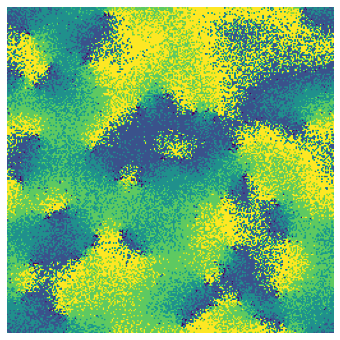

In [6]:
plot.figure(figsize=(6, 6))
plot.imshow(geo.sites)
plot.axis('off')
plot.show()